In [ ]:
%%capture
!pip install wandb
!pip install swig
!pip install gymnasium
!pip install gym[box2d]

In [ ]:
# Define environment for RL agent and for evaluation episodes
import gymnasium as gym

env = gym.make('BipedalWalker-v3', hardcore = True, render_mode = "rgb_array")
eval_env = gym.make('BipedalWalker-v3', hardcore = True, render_mode = "rgb_array")

In [ ]:
import torch
import torch.nn as nn
import collections
import copy
import tqdm
import random
import math
import numpy as np
from PIL import Image

# Environment constants
INPUT_DIM = 24
ACTIONS = 4
EXPERIENCE_MEM = int(1e5)

# Model architecture
Q_sz = [(INPUT_DIM + ACTIONS, 256), (256, 256), (256, 1)]
policy_sz = [(INPUT_DIM, 256), (256, 256), (256, ACTIONS)]

# Experiment hyperparameters to log to wandb
config = {
    "CYCLES": 100000,
    "EXPLORE_CYCLES": 10,
    "RANDOM_EXPLORE_CYCLES": 5000,
    "UPDATE_Q_CYCLES": 2,
    "EVAL_FREQ": 100,
    "BATCH_SZ": 128,
    "GAMMA": 0.99,
    "TAU": 0.01,
    "EXPLORE_NOISE": 0.1,
    "ACTION_NOISE": 0.2,
    "ACTION_NOISE_CLIP": 0.5,
    "NOISE_DECAY": 1 - 5e-5,
    "REWARD_CLIP": 100,
    "MAX_LR": 1e-3,
    "MIN_LR": 1e-5,
    "MIN_NOISE_SCALE": 0.05,
    "LR_DECAY": 1 - 1e-4
}

# Unpack hyperparameters from config
CYCLES = config['CYCLES']
EXPLORE_CYCLES = config['EXPLORE_CYCLES']
RANDOM_EXPLORE_CYCLES = config['RANDOM_EXPLORE_CYCLES']
UPDATE_Q_CYCLES = config['UPDATE_Q_CYCLES']
EVAL_FREQ = config['EVAL_FREQ']
BATCH_SZ = config['BATCH_SZ']
GAMMA = config['GAMMA']
TAU = config['TAU']
EXPLORE_NOISE = config['EXPLORE_NOISE']
ACTION_NOISE = config['ACTION_NOISE']
ACTION_NOISE_CLIP = config['ACTION_NOISE_CLIP']
LR = config['MAX_LR']
MIN_LR = config['MIN_LR']
LR_DECAY = config['LR_DECAY']
NOISE_DECAY = config['NOISE_DECAY']
REWARD_CLIP = config['REWARD_CLIP']
MIN_ACTION_NOISE = config['MIN_NOISE_SCALE'] * ACTION_NOISE
MIN_EXLORE_NOISE = config['MIN_NOISE_SCALE'] * EXPLORE_NOISE

device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
def layer_init(m):
    if type(m) is nn.Linear:
        nn.init.kaiming_normal_(m.weight)
        if m.bias is not None:
            torch.nn.init.zeros_(m.bias)

In [ ]:
# MLP used for policy and Q-value functions
class MLP(nn.Module):
    def __init__(self, model_sz, act_fn):
        super().__init__()
        self.lin = nn.Sequential(
            *[nn.Linear(x, y) if i % 2 == 0 else nn.ReLU() for x, y in model_sz for i in range(2)]
        ).apply(layer_init)
        if act_fn == None:
            self.lin = self.lin[:-1]
        else:
            self.lin[-1] = act_fn

    def forward(self, inp):
        return self.lin(inp)

In [ ]:
# Define memory for experience learning
Experience = collections.namedtuple('Experience', ('cur_state', 'action', 'reward', 'future_state'))
memory = collections.deque(maxlen = EXPERIENCE_MEM)

In [ ]:
policy = MLP(policy_sz, nn.Tanh()).to(device)
Q1 = MLP(Q_sz, None).to(device)
Q2 = MLP(Q_sz, None).to(device)
Q1targ = copy.deepcopy(Q1)
Q2targ = copy.deepcopy(Q2)
policy_opt = torch.optim.AdamW(policy.parameters(), lr = LR, eps = 1e-4)
Q_opt = torch.optim.AdamW(list(Q1.parameters()) + list(Q2.parameters()), lr = LR, eps = 1e-4)

In [ ]:
# Log into Weights & Biases
! wandb login

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [ ]:
# Initialize experiment tracking
import wandb

EXP_NAME = "RL"

wandb.init(
    name = "TD3_BipedalWalkerv3HARDCORE",
    project = EXP_NAME,
    config = config
)

Actor Loss,██████▇▆▅▅▄▃▂▁▂▃▃▂▄▂▂▂▂▁▃▄▄▄▄▄▃▄▄▂▃▃▂▃▁▁
Critic Loss,▁▁▁▁▂▂▁▁▁▃▂▃▃▄▄▃▅▅▄▄▆▆█▄▆▇▄▆▄▄▃▄▇▄▃▄▆▄▄▄
Evaluation Reward,▁▃▃▃▃▄▄▅▄█▄▄█▆▅▅▄▅▅▄▅▄▄▆▅▅▆▇▅▇▆▄▅▅▅▄█▅▄▄
Learning Rate,█▇▆▄▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Q Predictions Norm,▁▂▂▃▃▃▃▄▄▄▅▆▇▇▇▇████████▇▇▇▇▇▇█▆▇▇▇▇▇▇▇█
Q Targets Norm,▁▂▂▃▃▃▃▄▄▄▅▇▇▇▇▇████████▇▇▇▇▇▇█▇▇▇▇▇▇▇▇█
Training Cumulative Reward,▂▁▁▂▂▂▂▂▂▂▂▂▂▂▃▅▃▃▂▃▇▂▃▄▄▃█▅▂▄▇▃▂▂▇▅▃▃▃▃
Training Epoch Steps,▂▁▂▁▁▁▁▂▃▂▃▂▂▂▃▃▃▃▃█▇▄▂▃▃▂█▄▂▄▅▃▂▂▇▃▂▂▃▂
Actor Loss,-4.50121
Critic Loss,0.32221
Evaluation Reward,-70.10074


In [ ]:
total_explores = 0
cur_epoch_steps = 0
cur_epoch_reward = 0
epoch_num = 0
rewards_graph = []
state = None

with tqdm.tqdm(total = CYCLES) as t:
    for cyc_num in range(CYCLES):
        # LR Scheduling
        for param in policy_opt.param_groups:
            param['lr'] = max(MIN_LR, param['lr'] * LR_DECAY)
        for param in Q_opt.param_groups:
            param['lr'] = max(MIN_LR, param['lr'] * LR_DECAY)

        # Noise Scheduling
        ACTION_NOISE *= NOISE_DECAY
        ACTION_NOISE = max(ACTION_NOISE, MIN_ACTION_NOISE)
        EXPLORE_NOISE *= NOISE_DECAY
        EXLORE_NOISE = max(EXPLORE_NOISE, MIN_EXPLORE_NOISE)

        wandb.log({"Learning Rate": Q_opt.param_groups[0]['lr']}, step = cyc_num)

        if cyc_num % EVAL_FREQ == 0:
            eval_state, _ = eval_env.reset()
            eval_terminated = False
            eval_truncated = False
            total_reward = 0
            while not (eval_terminated or eval_truncated):
                eval_state, eval_reward, eval_terminated, eval_truncated, _ = eval_env.step(policy(torch.tensor(eval_state, device=device)).detach().cpu().numpy())
                total_reward += eval_reward
            rewards_graph.append(total_reward)
            print(f"Current Evaluation Reward: {total_reward}")
            wandb.log({"Evaluation Reward": total_reward}, step = cyc_num)
        for j in range(EXPLORE_CYCLES):
            if state is None:
                wandb.log({"Training Epoch Steps": cur_epoch_steps}, step = cyc_num)
                wandb.log({"Training Cumulative Reward": cur_epoch_reward}, step = cyc_num)
                cur_epoch_steps = 0
                cur_epoch_reward = 0
                epoch_num += 1
                state, _ = env.reset()

            if total_explores < RANDOM_EXPLORE_CYCLES:
                action = np.random.rand(ACTIONS) * 2 - 1
            else:
                action = torch.clip(policy(torch.tensor(state, device=device)) + torch.normal(0.0, EXPLORE_NOISE, size = (ACTIONS,)).to(device), -1, 1).detach().cpu().numpy()
            new_state, reward, terminated, truncated, _ = env.step(action)
            cur_epoch_reward += reward
            # Only put a none state into the replay buffer if the policy actually died - not if the episode truncated
            if terminated:
                new_state = None

            # Reward clipping to ensure stable training
            clip_reward = max(min(reward, 5.0), -5.0)

            if cur_epoch_steps != 0:
              memory.append(Experience(state, action, clip_reward, new_state))

            # Set to none the next state if the episode truncated
            if truncated:
                new_state = None
            state = new_state

            total_explores += 1
            cur_epoch_steps += 1

        if len(memory) > BATCH_SZ:
            for j in range(UPDATE_Q_CYCLES):
                # Update Q networks
                experiences = random.sample(memory, BATCH_SZ)
                states = []
                rewards = []
                actions = []
                future_states = []
                future_states_not_none = []

                for idx, i in enumerate(experiences):
                    states.append(i.cur_state)
                    rewards.append(i.reward)
                    actions.append(i.action)
                    if i.future_state is not None:
                        future_states_not_none.append(idx)
                        future_states.append(i.future_state)

                states = np.array(states)
                rewards = np.array(rewards)
                actions = np.array(actions)
                future_states = np.array(future_states)

                states = torch.tensor(states, device = device, dtype = torch.float32)
                rewards = torch.tensor(rewards, device = device, dtype = torch.float32)
                actions = torch.tensor(actions, device = device, dtype = torch.float32)
                future_states = torch.tensor(future_states, device = device, dtype = torch.float32)

                Q_opt.zero_grad(set_to_none = True)
                V = torch.zeros_like(rewards, device=device, dtype = torch.float32)
                noise = torch.clip(torch.normal(0, ACTION_NOISE, size = (len(future_states), ACTIONS)), -ACTION_NOISE_CLIP, ACTION_NOISE_CLIP).to(device)
                future_actions = torch.clip(policy(future_states) + noise, -1, 1)
                V[future_states_not_none] = torch.min(Q1targ(torch.cat([future_states, future_actions], dim = -1)), Q2targ(torch.cat([future_states, future_actions], dim = -1))).squeeze()
                q_targ = rewards + GAMMA * V
                q1_pred = Q1(torch.cat([states, actions], dim = -1))
                q2_pred = Q2(torch.cat([states, actions], dim = -1))
                Q1_loss = nn.functional.mse_loss(q1_pred.squeeze(), q_targ)
                Q2_loss = nn.functional.mse_loss(q2_pred.squeeze(), q_targ)
                Q_loss = Q1_loss + Q2_loss
                # Reduce logging frequency to not log loss twice in one cycle (since Q is updated multiple times per cycle)
                if j == 0:
                    wandb.log({"Critic Loss": Q_loss}, step = cyc_num)
                    wandb.log({"Q Predictions Norm": torch.norm(q1_pred.squeeze())}, step = cyc_num)
                    wandb.log({"Q Targets Norm": torch.norm(q_targ)}, step = cyc_num)
                Q_loss.backward()
                nn.utils.clip_grad_norm_(Q1.parameters(), 5.0)
                nn.utils.clip_grad_norm_(Q2.parameters(), 5.0)
                Q_opt.step()

            # Update target Q networks
            Q1_state_dict = Q1.state_dict()
            Q1targ_state_dict = Q1targ.state_dict()

            for param, _ in Q1targ_state_dict.items():
                Q1targ_state_dict[param] = TAU * Q1_state_dict[param] + (1 - TAU) * Q1targ_state_dict[param]

            Q1targ.load_state_dict(Q1targ_state_dict)

            Q2_state_dict = Q2.state_dict()
            Q2targ_state_dict = Q2targ.state_dict()

            for param, _ in Q2targ_state_dict.items():
                Q2targ_state_dict[param] = TAU * Q2_state_dict[param] + (1 - TAU) * Q2targ_state_dict[param]

            Q2targ.load_state_dict(Q2targ_state_dict)

            # Update policy
            policy.zero_grad(set_to_none = True)
            policy_loss = -torch.mean(Q1(torch.cat([states, policy(states)], dim = -1)))
            wandb.log({"Actor Loss": policy_loss}, step = cyc_num)
            policy_loss.backward()
            nn.utils.clip_grad_norm_(policy.parameters(), 5.0)
            policy_opt.step()

        t.update(1)

  0%|          | 0/100000 [00:00<?, ?it/s]


NameError: ignored

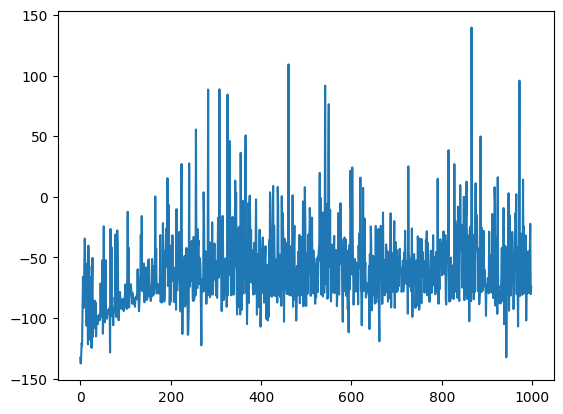

In [ ]:
import matplotlib.pyplot as plt

# Use rolling average to smooth the rewards graph (if necessary)
rolling_average_len = 1
smooth_rewards_graph = np.cumsum(rewards_graph)
smooth_rewards_graph = smooth_rewards_graph[rolling_average_len:] - smooth_rewards_graph[:-rolling_average_len]
smooth_rewards_graph = smooth_rewards_graph.astype(float) / rolling_average_len

plt.plot(smooth_rewards_graph)
plt.show()

Visualize Trained Policy

In [ ]:
%%capture
!apt update
!apt install xvfb
! pip install pyvirtualdisplay

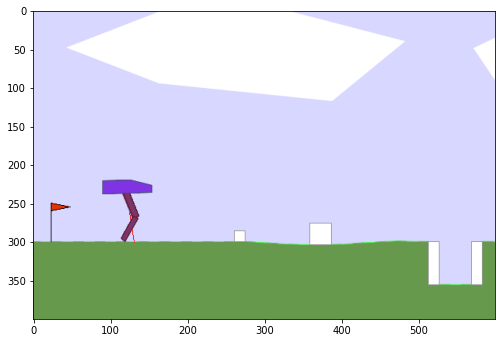

In [ ]:
import gym
from IPython import display
from pyvirtualdisplay import Display
from matplotlib import animation
import matplotlib.pyplot as plt

plt.rcParams['animation.embed_limit'] = 2**64

d = Display()
d.start()

o, _ = env.reset()
rewards_over_time = []
img = []
for x in range(1000):
    o, r, d, i, __ = env.step(policy(torch.tensor(o, device=device)).detach().cpu().numpy())
    rewards_over_time.append(r)
    display.clear_output(wait=True)
    img.append(env.render())

    if d or i:
        o, _ = env.reset()

dpi = 72
interval = 50 # ms

plt.figure(figsize=(img[0].shape[1]/dpi,img[0].shape[0]/dpi),dpi=dpi)
patch = plt.imshow(img[0])
plt.axis=('off')
animate = lambda i: patch.set_data(img[i])
ani = animation.FuncAnimation(plt.gcf(),animate,frames=len(img),interval=interval)
display.display(display.HTML(ani.to_jshtml()))

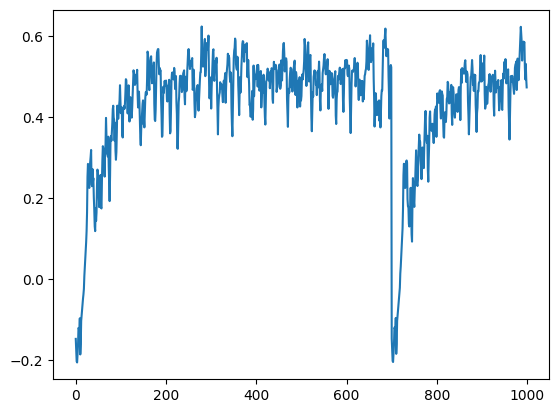

In [ ]:
plt.plot(rewards_over_time)

Save trained policy model and trained policy demonstration video to wandb

In [ ]:
torch.save(policy.state_dict(), "./trained_model.pth")
ani.save("./policy_demonstration.gif", writer = "imagemagick")

In [ ]:
artifact = wandb.Artifact("Trained_Model", type='model')
artifact.add_file("./trained_model.pth")
artifact.add_file("./policy_demonstration.gif")
wandb.log_artifact(artifact)

<Artifact Trained_Model>

In [ ]:
# Close wandb
wandb.finish()

Actor Loss,▇▇▇████▇▇▇▇▇██▇▆▆▅▄▄▄▃▃▃▂▃▂▂▂▃▂▂▂▂▂▁▁▂▁▁
Evaluation Reward,▂▁▁▂▂▃▂▁▁▁▂▂▂▄▇█▃▁██████▁█████▂█████████
Training Cumulative Reward,▁▁▂▂▂▂▂▂▂▃▃▂▃▁▇█████████▃██▁████████████
Training Epoch Steps,▁█▂█▁▁█████▁█▃█▆▅▆▅▅▅▅▄▅▂▅▄▂▅▅▅▄▄▄▄▄▄▄▄▄
Actor Loss,-36.93285
Evaluation Reward,311.34543
Training Cumulative Reward,312.23016
Training Epoch Steps,721


‍